# Animation des parcours

Ce notebook, rédigé en Python, illustre les parcours de graphes (DFS, BFS). [Le module cpge utilisé est disponible ici](https://github.com/cpge-itc/itc-code).

## Parcours en profondeur

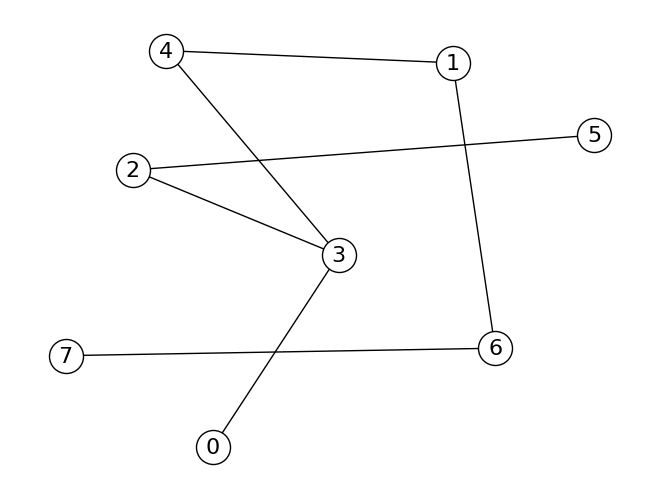

In [2]:
import cpge.graph

G = cpge.graph.random_list() # graphe aléatoire représenté par liste d'adjacence
cpge.graph.draw(G)

In [3]:
cpge.graph.anim_dfs(G) # parcours en profondeur depuis le sommet 0

## Parcours en largeur

In [4]:
cpge.graph.anim_bfs(G)

## Labyrinthe

### Génération par parcours en profondeur

On souhaite générer un labyrinthe parfait (possédant un unique chemin de point à un autre - c'est-à-dire dont le graphe sous-jacent est un arbre) comme celui ci-dessous.   
Pour cela, on peut faire partir un parcours en largeur sur un graphe "grille" de taille $n\times p$ et ne conserver que les arêtes traversées par le parcours.  
À chaque appel récursif de `dfs`, on s'applique aléatoirement sur un des $4$ voisins qui n'a pas encore été visité.

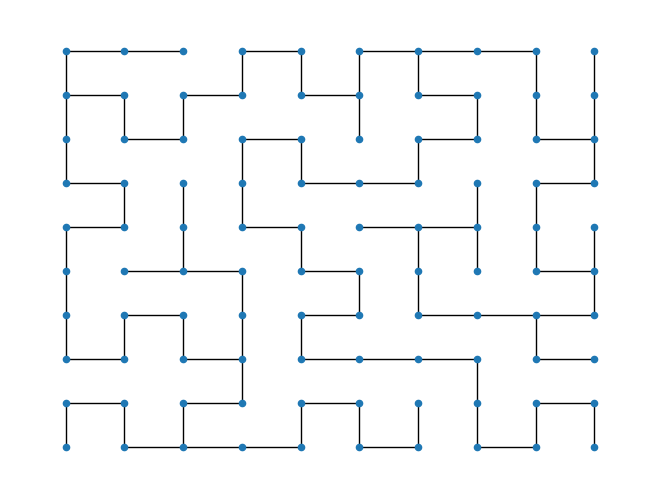

In [8]:
import matplotlib.pyplot as plt
import networkx as nx
import random

def generate_labyrinth(n, p):
    G = nx.Graph()
    G.add_nodes_from((i, j) for i in range(n) for j in range(p))
    visited = [[False]*p for _ in range(n)]
    def dfs(i, j):
        visited[i][j] = True
        neighbors = [(i+1, j), (i-1, j), (i, j+1), (i, j-1)]
        random.shuffle(neighbors)
        for x, y in neighbors:
            if 0 <= x < n and 0 <= y < p and not visited[x][y]:
                G.add_edge((i, j), (x, y))
                dfs(x, y)
    dfs(n - 1, 0)
    return G

def draw(G, **keywords):
    plt.clf()
    nx.draw(G, pos={p: p for p in G.nodes()}, node_size=20, **keywords)
    plt.show()

n = 10
draw(G := generate_labyrinth(n, n))

### Résolution

#### Par parcours en profondeur

On cherche maintenant à trouver le chemin de l'entrée (case en bas à gauche) à la sortie (en haut à droite). Pour cela, on effectue encore un parcours en profondeur depuis l'entrée, jusqu'à trouver la sortie :

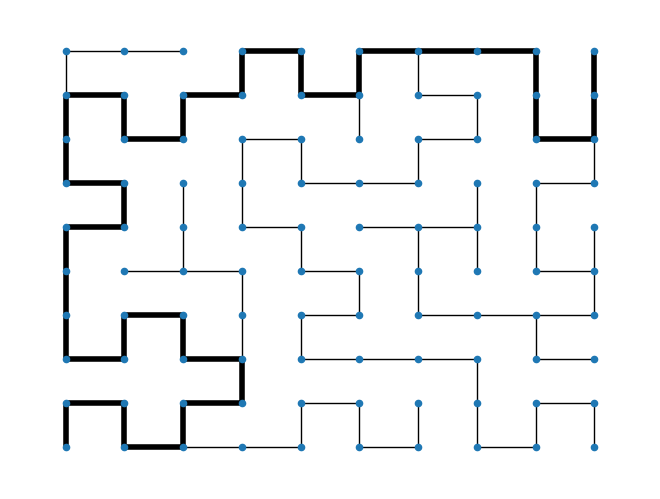

In [9]:
def solve_labyrinth(G, n):
    visited = [[False]*n for _ in range(n)]
    path = []
    for i,e in enumerate(G.edges):
        G.edges[e]['index'] = i
    def dfs(i, j):
        if i == n - 1 == j:
            return True
        visited[i][j] = True
        neighbors = [(i+1, j), (i-1, j), (i, j+1), (i, j-1)]
        random.shuffle(neighbors)
        for x, y in neighbors:
            if 0 <= x < n and 0 <= y < n and (x, y) in G[(i, j)] and not visited[x][y]:
                if dfs(x, y):
                    path.append(G[(i, j)][(x, y)]['index'])
                    return True
        return False
    dfs(0, 0)
    return path

path = solve_labyrinth(G, n)
widths = [4 if i in path else 1 for i in range(len(G.edges))]
draw(G, width=widths)

Animation de la résolution du labyrinthe par parcours en profondeur :

In [10]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation
from IPython.display import HTML

def anim_graph(G, widths):
    fig, ax = plt.subplots(figsize=(20,12))
    plt.close()
    def update(frame):
        ax.clear()
        nx.draw(G, ax=ax, pos={p: p for p in G.nodes()}, node_size=700, width=widths[frame])
    ani = matplotlib.animation.FuncAnimation(fig, update, frames=len(widths), interval=80)
    return HTML(ani.to_jshtml(default_mode="once"))

def solve_labyrinth_dfs(G, n):
    widths = [1]*len(G.edges)
    visited = [[False]*n for _ in range(n)]
    frame_widths = []
    for i,e in enumerate(G.edges):
        G.edges[e]['index'] = i
    def dfs(i, j):
        if i == n - 1 == j:
            return True
        visited[i][j] = True
        neighbors = [(i+1, j), (i-1, j), (i, j+1), (i, j-1)]
        random.shuffle(neighbors)
        for x, y in neighbors:
            if 0 <= x < n and 0 <= y < n and (x, y) in G[(i, j)] and not visited[x][y]:
                widths[G[(i, j)][(x, y)]['index']] = 6
                frame_widths.append(widths.copy())
                if dfs(x, y):
                    return True
                widths[G[(i, j)][(x, y)]['index']] = 1
                frame_widths.append(widths.copy())
        return False
    dfs(0, 0)
    return frame_widths

anim_graph(G, solve_labyrinth_dfs(G, n))

#### Par parcours en largeur

In [11]:
from collections import deque

def solve_labyrinth_bfs(G, n):
    widths = [1]*len(G.edges)
    visited = [[False]*n for _ in range(n)]
    frame_widths = []
    for i, e in enumerate(G.edges):
        G.edges[e]['index'] = i
    q = deque([(0, 0)])
    while len(q) > 0:
        i, j = q.pop()
        if i == n - 1 == j:
            break
        visited[i][j] = True
        neighbors = [(i+1, j), (i-1, j), (i, j+1), (i, j-1)]
        random.shuffle(neighbors)
        for x, y in neighbors:
            if 0 <= x < n and 0 <= y < n and (x, y) in G[(i, j)] and not visited[x][y]:
                widths[G[(i, j)][(x, y)]['index']] = 6
                frame_widths.append(widths.copy())
                q.appendleft((x, y))
    return frame_widths

anim_graph(G, solve_labyrinth_bfs(G, n))

```{raw} html
<script
   type="text/javascript"
   src="https://utteranc.es/client.js"
   async="async"
   repo="mp-info/mp-info.github.io"
   issue-term="pathname"
   theme="github-light"
   label="💬 comment"
   crossorigin="anonymous"
/>
```
